
## 🔢 1. **FFT and IFFT Formulas**


### ✅ **FFT (Forward Transform)**

Given a sequence $x[n]$, $n = 0, 1, ..., N-1$,
the Discrete Fourier Transform (DFT) is:

$$
X[k] = \sum_{n=0}^{N-1} x[n] \cdot e^{-j \frac{2\pi}{N} k n}
$$

Where:

* $X[k]$: complex coefficient for frequency bin $k$
* $e^{-j 2\pi kn/N}$: basis function — a complex sinusoid
* $j$: imaginary unit (i.e., $\sqrt{-1}$)

---

### 🔍 **Intuition**:

* You're **projecting the signal** onto a set of **sinusoids** with different frequencies.
* Each $X[k]$ tells you:

  * **How much** of that frequency $f_k = \frac{k}{N}$ is in the signal,
  * And **what phase** it has (through the complex part).

---

### ✅ **IFFT (Inverse Transform)**

$$
x[n] = \frac{1}{N} \sum_{k=0}^{N-1} X[k] \cdot e^{+j \frac{2\pi}{N} k n}
$$

Just the reverse:

* Take each frequency component $X[k]$,
* Create its corresponding sinusoid (using amplitude and phase),
* **Add them all** to reconstruct the signal.

---



## 📐 2. **What Does `np.angle()` Do?**

### ✅ Definition:

```python
np.angle(z)
```

* Takes a **complex number** $z = a + jb$
* Returns the **angle** $\theta$ (in radians) between the vector and the real axis:

  $$
  \theta = \tan^{-1} \left(\frac{b}{a}\right)
  $$

---

### 🧠 Intuition:

Every FFT output $X[k]$ is a complex number:

$$
X[k] = A_k \cdot e^{j\phi_k}
$$

Where:

* $A_k = |X[k]|$: magnitude (from `np.abs`)
* $\phi_k = \text{phase}$: angle (from `np.angle`)

So:

* `np.abs(X[k])`: tells you **how strong** the frequency $f_k$ is.
* `np.angle(X[k])`: tells you **where** (in time) that sinusoid starts (its **offset** or **delay**).

---

### 🌀 Geometric View:

Complex number $X[k]$ is a vector in the complex plane:

* **Length**: amplitude
* **Direction**: phase angle

`np.angle()` gives the **direction** (phase), so you can reconstruct the sinusoid with the correct timing.

---

###  Table:

| Operation        | Formula                                              | Intuition                                  |
| ---------------- | ---------------------------------------------------- | ------------------------------------------ |
| FFT              | $X[k] = \sum x[n] \cdot e^{-j2\pi kn/N}$             | Decompose signal into frequency components |
| IFFT             | $x[n] = \frac{1}{N} \sum X[k] \cdot e^{+j2\pi kn/N}$ | Reconstruct signal from frequency parts    |
| `np.abs(X[k])`   | $\sqrt{a^2 + b^2}$                                   | Amplitude of frequency $f_k$               |
| `np.angle(X[k])` | $\tan^{-1}(b/a)$                                     | Phase shift (when the wave starts)         |



In [88]:
from datasetsforecast.m4 import M4

M4.download("data/")
df = M4.load("data/", group="Daily")[0]

In [89]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import fftpack
from sklearn.linear_model import LinearRegression

# Function to perform FFT analysis and return results


def perform_fft_analysis(df, column_name):
    # Extract series
    y = df[column_name].values
    n = len(y)
    t = np.arange(n).reshape(-1, 1)  # Reshape for sklearn (n_samples, n_features)

    # Detrend with sklearn LinearRegression
    model = LinearRegression()
    model.fit(t, y)
    trend = model.predict(t)
    y_detrended = y - trend

    # Perform Fourier transform on detrended series
    y_fft = fftpack.fft(y_detrended)

    # Frequency domain
    freqs = fftpack.fftfreq(n)  # Cycles per sample
    amplitudes = np.abs(y_fft) / n
    phases = np.angle(X)

    # Positive frequencies (exclude DC)
    positive_mask = freqs > 0
    freqs_pos = freqs[positive_mask]
    mags_pos = amplitudes[positive_mask]

    # Convert to periods
    periods = 1 / freqs_pos
    periods = np.round(periods, 2)

    # Find dominant period
    max_mag_idx = np.argmax(mags_pos)
    dominant_period = periods[max_mag_idx]
    dominant_freq = freqs_pos[max_mag_idx]
    dominant_mag = mags_pos[max_mag_idx]
    # print('dominant_period',dominant_period)
    if df.shape[0] / dominant_period >= 3:
        print("Period : ", round(dominant_period))
    return {
        "y": y,
        "amplitudes": amplitudes,
        "phases": phases,
        "y_detrended": y_detrended,
        "freqs_pos": freqs_pos,
        "mags_pos": mags_pos,
        "periods": periods,
        "dominant_period": dominant_period,
        "dominant_freq": dominant_freq,
        "dominant_mag": dominant_mag,
        "trend": trend,
    }, periods


# Function to plot FFT analysis results


def plot_fft_results(fft_results):
    y = fft_results["y"]
    y_detrended = fft_results["y_detrended"]
    freqs_pos = fft_results["freqs_pos"]
    mags_pos = fft_results["mags_pos"]
    periods = fft_results["periods"]
    dominant_period = fft_results["dominant_period"]
    dominant_freq = fft_results["dominant_freq"]
    dominant_mag = fft_results["dominant_mag"]
    trend = fft_results["trend"]

    # Plot
    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=(
            "Original Time Series",
            "Detrended Time Series",
            "Original FFT",
            "Detrended FFT",
        ),
        shared_yaxes=False,
        vertical_spacing=0.15,
    )

    # Original time series
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(y)), y=y, mode="lines", name="Original", line=dict(color="blue")
        ),
        row=1,
        col=1,
    )

    # Detrended time series
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(y_detrended)),
            y=y_detrended,
            mode="lines",
            name="Detrended",
            line=dict(color="blue"),
        ),
        row=1,
        col=2,
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(len(trend)), y=trend, mode="lines", name="Trend", line=dict(color="blue")
        ),
        row=1,
        col=1,
    )

    # Original FFT
    fig.add_trace(
        go.Scatter(
            x=freqs_pos,
            y=mags_pos,
            mode="markers+lines",
            name="Orig. Magnitude",
            marker=dict(color="red", size=8),
            line=dict(width=0),
        ),
        row=2,
        col=1,
    )

    # Detrended FFT with hover showing periods
    fig.add_trace(
        go.Scatter(
            x=freqs_pos,
            y=mags_pos,
            mode="markers+lines",
            name="Detrended Magnitude",
            marker=dict(color="red", size=8),
            line=dict(width=0),
            customdata=periods,
            hovertemplate="Freq: %{x:.4f}<br>Mag: %{y:.2f}<br>Period: %{customdata:.2f}",
        ),
        row=2,
        col=2,
    )

    # Highlight dominant frequency
    fig.add_trace(
        go.Scatter(
            x=[dominant_freq],
            y=[dominant_mag],
            mode="markers",
            marker=dict(color="green", size=12, symbol="star"),
            name=f"Period {dominant_period}",
        ),
        row=2,
        col=2,
    )

    # Update layout
    fig.update_layout(
        title_text=f"FFT Analysis with sklearn Detrending: Dominant Period = {dominant_period} samples",
        height=600,
        width=1200,
        showlegend=True,
    )

    # Update axes
    fig.update_xaxes(title_text="Time (Samples)", row=1, col=1)
    fig.update_xaxes(title_text="Time (Samples)", row=1, col=2)
    fig.update_xaxes(title_text="Frequency (Cycles/Sample)", row=2, col=1)
    fig.update_xaxes(title_text="Frequency (Cycles/Sample)", row=2, col=2)
    fig.update_yaxes(title_text="Amplitude", row=1, col=1)
    fig.update_yaxes(title_text="Amplitude", row=1, col=2)
    fig.update_yaxes(title_text="Magnitude", row=2, col=1)
    fig.update_yaxes(title_text="Magnitude", row=2, col=2)

    fig.show()

In [122]:
import numpy as np
import plotly.graph_objects as go


def get_optimal_k(X, energy_threshold=0.95, plot=False):
    """
    Determine optimal number of FFT components (K) that retain a given percentage of total signal energy.
    Displays interactive cumulative energy plot if plot=True.
    """
    # Compute power spectrum
    power = np.abs(X) ** 2
    total_energy = np.sum(power)

    # Sort frequency bins by descending power
    sorted_indices = np.argsort(power)[::-1]
    sorted_power = power[sorted_indices]

    # Compute normalized cumulative energy
    cumulative_energy = np.cumsum(sorted_power) / total_energy

    # Find the smallest K that retains the required energy
    K = np.searchsorted(cumulative_energy, energy_threshold) + 1
    top_indices = sorted_indices[:K]

    # Plotly interactive plot
    if plot:
        k_values = np.arange(1, len(cumulative_energy) + 1)
        fig = go.Figure()

        # Line plot of cumulative energy
        fig.add_trace(
            go.Scatter(
                x=k_values,
                y=cumulative_energy,
                mode="lines",
                name="Cumulative Energy",
                line=dict(color="blue"),
            )
        )

        # Horizontal threshold line
        fig.add_trace(
            go.Scatter(
                x=[1, len(cumulative_energy)],
                y=[energy_threshold, energy_threshold],
                mode="lines",
                name=f"{int(energy_threshold * 100)}% Threshold",
                line=dict(color="red", dash="dash"),
            )
        )

        # Vertical line at optimal K
        fig.add_trace(
            go.Scatter(
                x=[K, K],
                y=[0, 1],
                mode="lines",
                name=f"Optimal K = {K}",
                line=dict(color="green", dash="dash"),
            )
        )

        fig.update_layout(
            title="Cumulative Energy vs K (FFT Components)",
            xaxis_title="Top-K Components",
            yaxis_title="Cumulative Energy",
            legend=dict(x=0.8, y=0.05),
            height=450,
        )

        fig.show()

    return K

In [123]:
unique_ids = df.unique_id.unique()
import random

random.choice(unique_ids)
ds = df[df.unique_id == random.choice(unique_ids)]
ds.reset_index(drop=True, inplace=True)
# Assuming you have a DataFrame `df` with a column "y"
# Perform FFT analysis
print("Total no. of datapoints:", ds.shape[0])


fft_results, periods = perform_fft_analysis(ds, "y")
period = round(fft_results["dominant_period"])
print(
    "Total Cycle:", ds.shape[0] // fft_results["dominant_period"], fft_results["dominant_period"]
)


# Plot the FFT results
plot_fft_results(fft_results)

Total no. of datapoints: 3837
Period :  1279
Total Cycle: 3.0 1279.0


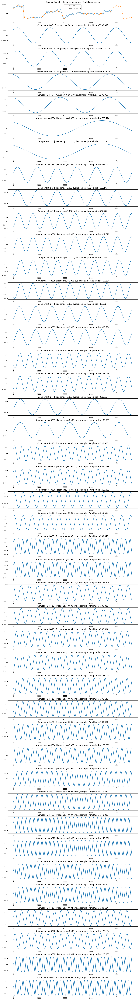

In [124]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fftpack import fft

# 1. Create signal
N = ds.shape[0]
t = np.arange(N)
# x = np.sin(2 * np.pi * 5 * t / N) + 0.7 * np.random.randn(N)
x = fft_results["y_detrended"]

# 2. FFT
X = fft(x)

# 3. Get amplitudes and phases
amplitudes = np.abs(X) / N
phases = np.angle(X)

# 4. Top-K
K = get_optimal_k(X, energy_threshold=0.95, plot=True)
indices = np.argsort(amplitudes)[-K:]


# 5. Manual IFFT from top-K
top_k_components = []

# Sort indices by amplitude (descending)
sorted_indices = sorted(indices, key=lambda k: amplitudes[k], reverse=True)

reconstructed = np.zeros_like(t, dtype=float)

t_future = np.arange(N, N + N * 0.2)
t_extended = np.concatenate([t, t_future])
reconstructed = np.zeros_like(t_extended, dtype=float)
for k in sorted_indices:
    A = amplitudes[k]
    phi = phases[k]
    component = A * np.cos(2 * np.pi * k * t_extended / (N) + phi)
    reconstructed += component
    top_k_components.append((k, A, component))


# 6. Plot

fig, axes = plt.subplots(K + 1, 1, figsize=(12, 2 * K + 3), constrained_layout=True)
# Original vs reconstructed
axes[0].plot(x, label="Original", alpha=0.6)
axes[0].plot(reconstructed, label="Reconstructed", linestyle="--")
axes[0].set_title("Original Signal vs Reconstructed from Top K Frequencies")
axes[0].legend()

# Each top-k sinusoidal component
for i, (k, A, comp) in enumerate(top_k_components):
    freq = k / N
    axes[i + 1].plot(comp)
    axes[i + 1].set_title(
        f"Component k={k} | Frequency={freq:.3f} cycles/sample | Amplitude={A:.3f}"
    )

plt.show()


### 1. Energy Threshold (Recommended)

Use the cumulative sum of squared magnitudes.

Choose the smallest K that retains, say, 95% of the signal energy.


In [126]:
get_optimal_k(X, energy_threshold=0.95, plot=True)

42

In [127]:
# 2. Reconstruction Error Threshold

# Reconstruct the signal for increasing K until MSE < threshold.


from sklearn.metrics import mean_squared_error


def get_k_by_mse(x, X, max_k=60, mse_threshold=0.01):
    N = len(x)
    power = np.abs(X)
    sorted_indices = np.argsort(power)[::-1]

    for k in range(1, max_k + 1):
        X_k = np.zeros_like(X)
        X_k[sorted_indices[:k]] = X[sorted_indices[:k]]
        recon = np.fft.ifft(X_k).real
        mse = mean_squared_error(x, recon)
        if mse <= mse_threshold:
            return k, sorted_indices[:k]
    return max_k, sorted_indices[:max_k]


get_k_by_mse(x, X, max_k=80, mse_threshold=0.01)

(80,
 array([3834,    3,    2, 3835,    1, 3836,    5, 3832, 3830,    7, 3829,
           8, 3831,    6, 3827,   10, 3833,    4, 3824,   13,   11, 3826,
        3814,   23,   12, 3825, 3821,   16,   18, 3819, 3816,   21,   20,
        3817, 3812,   25, 3813,   24, 3822,   15,   29, 3808, 3811,   26,
          17, 3820, 3796,   41,   34, 3803,   14, 3823,   50, 3787, 3805,
          32,   28, 3809, 3797,   40, 3794,   43,   45, 3792,   66, 3771,
        3791,   46, 3818,   19,   27, 3810,   38, 3799, 3828,    9,   71,
        3766,   42, 3795]))